# Visual Genome Region Description Embeddings

In [3]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np
from visual_genome import api as vg
import urllib.request
from PIL import Image
import tensorflow as tf
import json
import nltk
import time
import torch
import re
import seaborn as sns
import pandas as pd
from nltk.cluster import KMeansClusterer
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer, util
from nltk.cluster import KMeansClusterer
from scipy.spatial import distance_matrix, distance
from sklearn.manifold import TSNE

## Images visualizations

In [5]:
def visualize_regions(image, regions):
    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5)
    img = Image.open(urllib.request.urlopen(image.url))   # url from API
    plt.imshow(img)
    ax = plt.gca()
    for region in regions:                                # visualize regions
        ax.add_patch(Rectangle((region.x, region.y),
                               region.width,
                               region.height,
                               fill=False,
                               edgecolor='red',
                               linewidth=3))
        ax.text(region.x, region.y, region.phrase, style='italic', bbox={'facecolor':'white', 'alpha':0.7, 'pad':10})
    fig = plt.gcf()
    plt.tick_params(labelbottom='off', labelleft='off')
    plt.show()

In [6]:
def retrieve_image(image_id):
    # find the image from api
    image = vg.get_image_data(id=image_id)   # VG api works here
    if image:
        print ("Image data:", image)
        reg = vg.get_region_descriptions_of_image(id=image_id)
        # show images
        visualize_regions(image, reg[:8])    # call with fewer regions for better visualization

## SentenceTransformer

Choose one model at a time due to computational resources

In [7]:
# pre-trained models
model_1 = SentenceTransformer('bert-base-nli-mean-tokens')
#model_2 = SentenceTransformer('paraphrase-mpnet-base-v2')    # raises warning
#model_3 = SentenceTransformer('paraphrase-distilroberta-base-v2')
#model_4 = SentenceTransformer('stsb-mpnet-base-v2')
#model_5 = SentenceTransformer('stsb-roberta-large')         # this is much slower, but the best for semantic similarity
#models = [model_1, model_2, model_3, model_4, model_5]
models = [model_1]

Some weights of the model checkpoint at /home/menorf/.cache/torch/sentence_transformers/sbert.net_models_bert-base-nli-mean-tokens/0_BERT were not used when initializing BertModel: ['classifier.weight', 'classifier.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [8]:
def get_embeddings(model, region_sentences):
    sentence_embeddings = model.encode(region_sentences)
    return sentence_embeddings

## Read images and their descriptions


In [9]:
image_regions = pd.read_csv("image_regions.xls")

In [10]:
image_regions.head()

,Image_id,region_sentences
0,1,"['the clock is green in colour', 'shade is alo..."
1,2,"['walk sign is lit up', 'man wearing silver ba..."
2,3,"['multi-line office phone system', 'electrical..."
3,4,"['blue curtains with sailboats on them.', 'a b..."
4,5,"['the floor is wooden', 'white cables are on t..."


In [11]:
image_regions["region_sentences"] = image_regions["region_sentences"].apply(eval)
regions = image_regions["region_sentences"].tolist()

# Get embeddings

In [12]:
key_list = ["embeddings_1"]
embeddings = dict.fromkeys(key_list)
for model, key in zip(models, key_list):
    values = []
    for corpus in regions:
        # returns a list of lists, one 768-length embedding per region sentence. 
        # Number of rows corresponds to number of sentences
        if corpus:
            emb = get_embeddings(model, corpus)
            # get mean value columnwise, so that sentence embeddings are averaged per region for each image
            emb = np.mean(np.array(emb), axis=0) 
            # for each model, a 768-length embedding is stored
            values.append(emb)
        else:
            values.append(0)
            print(0)

    embeddings[key] = values

In [13]:
for key in key_list:
    image_regions[key] = pd.Series(embeddings[key], index=image_regions.index) 
    # number of sentences x 768

In [14]:
image_regions.head()

,Image_id,region_sentences,embeddings_1
0,1,"[the clock is green in colour, shade is along ...","[0.40566474, -0.12362482, 0.019752672, 0.15865..."
1,2,"[walk sign is lit up, man wearing silver backp...","[0.36596128, -0.25411388, 0.34162927, 0.139071..."
2,3,"[multi-line office phone system, electrical an...","[0.017878236, 0.04534533, -0.07909415, 0.21892..."
3,4,"[blue curtains with sailboats on them., a blac...","[0.06528587, 0.06382945, -0.1563217, 0.2344452..."
4,5,"[the floor is wooden, white cables are on the ...","[-0.012615676, 0.086324565, 0.1678634, 0.32539..."


# Clustering

In [15]:
def clustering_question(images_regions, key, NUM_CLUSTERS):

    sentences = images_regions['region_sentences']

    X = np.array(images_regions[key].tolist())

    data = images_regions[['Image_id', 'region_sentences', key]].copy()
    
    kclusterer = KMeansClusterer(
        NUM_CLUSTERS, distance=nltk.cluster.util.cosine_distance,
        avoid_empty_clusters=True)

    assigned_clusters = kclusterer.cluster(data[key], assign_clusters=True)

    data['cluster'] = pd.Series(assigned_clusters, index=data.index)
    data['centroid'] = data['cluster'].apply(lambda x: kclusterer.means()[x])

    return data, assigned_clusters

In [16]:
def distance_from_centroid(row):
    # type of emb and centroid is different, hence using tolist below
    return distance_matrix([row[key]], [row['centroid'].tolist()])[0][0]

In [17]:
def nltk_inertia(feature_matrix, centroid):
    sum_ = []
    for i in range(feature_matrix.shape[0]):
        sum_.append(np.sum((feature_matrix[i] - centroid[i])**2))  

    return sum(sum_) 
def number_of_clusters(image_regions, key):
    sse = []
    list_k = list(range(10, 500, 50))

    for k in list_k:
        data, assigned_clusters = clustering_question(image_regions, key, k)
        sse.append(nltk_inertia(data[key].to_numpy(), data.centroid.to_numpy()))

    # Plot sse against k
    plt.figure(figsize=(6, 6))
    plt.title('Elbow method for '+key)
    plt.plot(list_k, sse, '-o')
    plt.xlabel(r'Number of clusters k')
    plt.ylabel('Sum of squared distance')
    plt.show()
"""
for key in key_list:
    number_of_clusters(image_regions, key)
"""

'\nfor key in key_list:\n    number_of_clusters(image_regions, key)\n'

In [18]:
n_clusters = 15

def make_clusters(key, images_regions, n_clusters):
    data, assigned_clusters = clustering_question(images_regions, key, NUM_CLUSTERS = n_clusters)
    # Compute centroid distance to the data
    data['distance_from_centroid'] = data.apply(distance_from_centroid, axis=1)
    return data

## TSNE visualizations

In [19]:
def tsne_visual(embedding_clusters, key):
    mat = np.matrix([x for x in embedding_clusters[key]])
    t_sne = TSNE(n_components=2)
    low_dim_data = t_sne.fit_transform(mat)
    print('Lower dim data has shape',low_dim_data.shape)
    tsne_df =  pd.DataFrame(low_dim_data, embedding_clusters['cluster'])
    plt.figure(figsize=(20,12))
    ax = sns.scatterplot(data=tsne_df[0], x=tsne_df[0], y=tsne_df[1], hue=tsne_df.index, palette = "viridis", s=80)
    ax.set_title('T-SNE BERT Embeddings')
    plt.show()
    return low_dim_data

## Similar image retrieval

In [20]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [21]:
def find_distances(images_regions, input_id, key, input_embedding = np.zeros(5)):
    distances = []     
    image_ids=images_regions.Image_id
    if input_id>0:
        reference_embedding = images_regions.loc[images_regions.Image_id == input_id][key]
        reference_embedding = reference_embedding.values[0].reshape(-1,1)
        corpus_embeddings = images_regions.loc[images_regions.Image_id != input_id][key]
    else:
        reference_embedding = input_embedding
        corpus_embeddings = images_regions[key]
        
    for j in range(len(corpus_embeddings)):  # rows of def_embeddings matrix
        defin = j
        if image_ids[j]!=input_id:      # avoid calculating distance with itself
            corpus = corpus_embeddings[j].reshape(-1,1)
            # euclidean distance between multidimensional vectors
            dist = distance.euclidean(reference_embedding, corpus)
            distances.append([image_ids[j], dist]) 
        
    # store in df
    col_names = ['image_id', 'distances']
    distances_df = pd.DataFrame(distances, columns=col_names)
    distances_df = distances_df.sort_values(by='distances', ascending=True)
    distances_df.to_csv('distances.csv', index=False)
    return distances_df

In [22]:
# given image id to retrieve its k most similar images

def retrieve_images(key, images_regions, input_id = -1, input_embedding = np.zeros(5)):
    print('Images retrieved using method:', key)
    top_k=10
    
    if input_id>0:
    # top_k results to return
        print('Reference image:', input_id)
        retrieve_image(input_id)
        distances_df=find_distances(images_regions, input_id, key)
    else:
        distances_df=find_distances(images_regions, input_id, key, input_embedding)
    top_images=distances_df.head(top_k)

    print("Top", top_k, "most similar images to image", input_id, "in Visual Genome:")
    for index, row in top_images.iterrows():   
        im_id = int(row.image_id)
        print("Image id:", im_id, "Euclidean distance: %.4f" % (row.distances))

        # find similar images from api and show
        retrieve_image(im_id)

    return top_images

# Method 1: bert-base-nli-mean-tokens

In [23]:
embeddings_method = "embeddings_1"
embedding_clusters=make_clusters(embeddings_method, image_regions, n_clusters)
embedding_clusters.head(5)

,Image_id,region_sentences,embeddings_1,cluster,centroid,distance_from_centroid
0,1,"[the clock is green in colour, shade is along ...","[0.40566474, -0.12362482, 0.019752672, 0.15865...",6,"[0.2515479, -0.101366416, 0.09161886, 0.110081...",3.514624
1,2,"[walk sign is lit up, man wearing silver backp...","[0.36596128, -0.25411388, 0.34162927, 0.139071...",6,"[0.2515479, -0.101366416, 0.09161886, 0.110081...",3.323670
2,3,"[multi-line office phone system, electrical an...","[0.017878236, 0.04534533, -0.07909415, 0.21892...",3,"[0.011486871, 0.09625797, -0.025079636, 0.1316...",4.339849
3,4,"[blue curtains with sailboats on them., a blac...","[0.06528587, 0.06382945, -0.1563217, 0.2344452...",3,"[0.011486871, 0.09625797, -0.025079636, 0.1316...",3.050863
4,5,"[the floor is wooden, white cables are on the ...","[-0.012615676, 0.086324565, 0.1678634, 0.32539...",3,"[0.011486871, 0.09625797, -0.025079636, 0.1316...",3.649085


Lower dim data has shape (108076, 2)


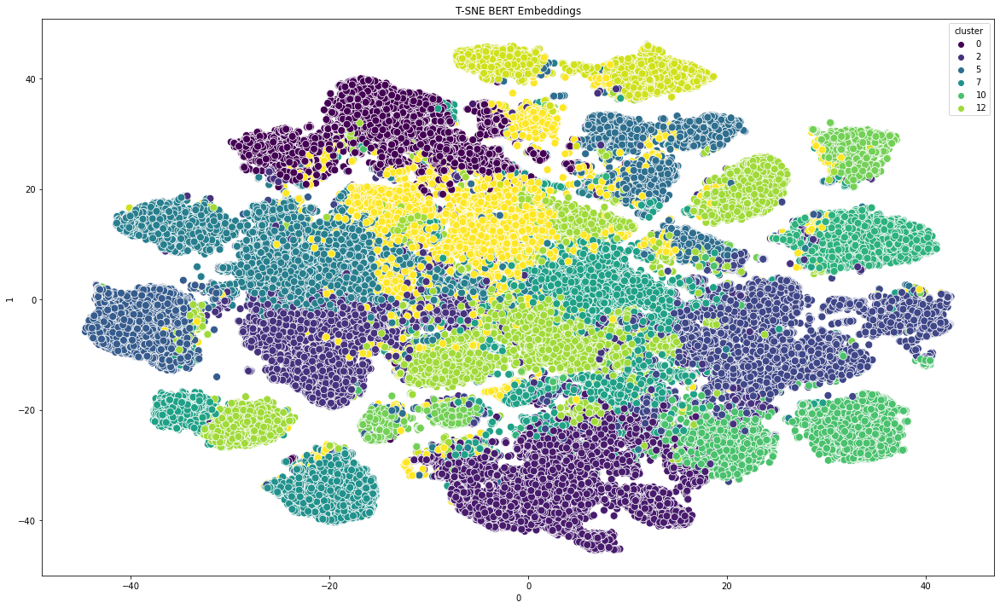

In [24]:
low_dim_data = tsne_visual(embedding_clusters, embeddings_method)

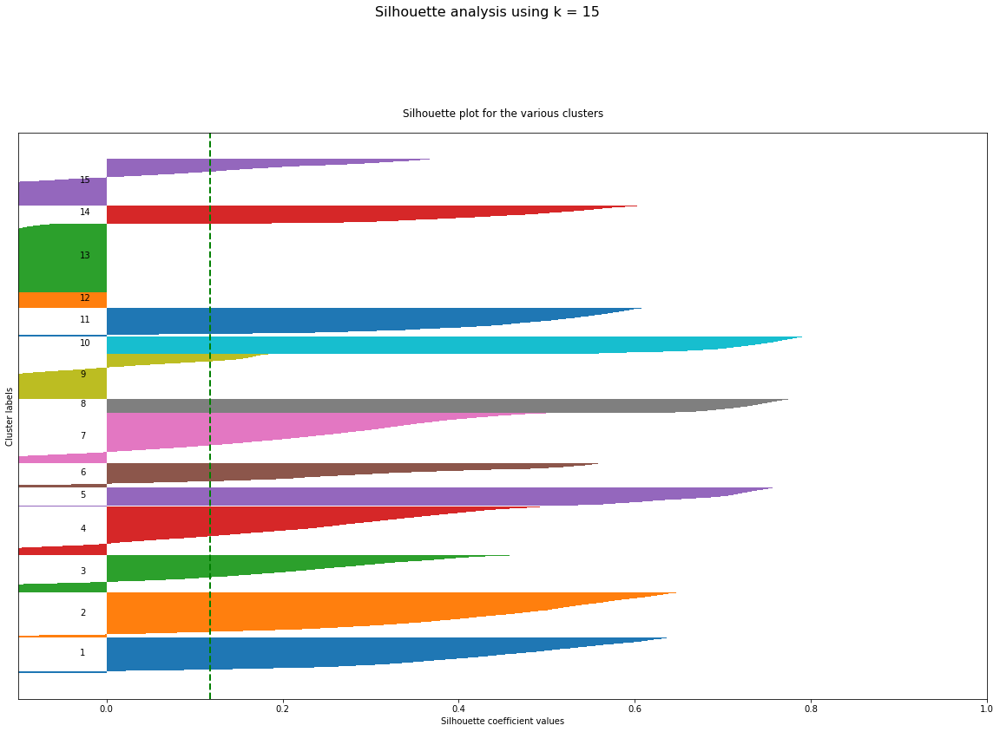

In [32]:
from sklearn.metrics import silhouette_samples, silhouette_score

# Get silhouette samples
low_embedding_clusters = low_dim_data
embedding_clusters=embedding_clusters

plt.figure(figsize=(20,12))

embedding_samples = low_embedding_clusters
labels = embedding_clusters['cluster'].to_numpy()
silhouette_vals = silhouette_samples(embedding_samples, labels)

# Silhouette plot
y_ticks = []
y_lower, y_upper = 0, 0
for i, cluster in enumerate(np.unique(labels)):
    cluster_silhouette_vals = silhouette_vals[labels == cluster]
    cluster_silhouette_vals.sort()
    y_upper += len(cluster_silhouette_vals)
    plt.barh(range(y_lower, y_upper), cluster_silhouette_vals, edgecolor='none', height=1)
    plt.text(-0.03, (y_lower + y_upper) / 2, str(i + 1))
    y_lower += len(cluster_silhouette_vals)


avg_score = np.mean(silhouette_vals)
plt.axvline(avg_score, linestyle='--', linewidth=2, color='green')
plt.yticks([])
plt.xlim([-0.1, 1])
plt.xlabel('Silhouette coefficient values')
plt.ylabel('Cluster labels')
plt.title('Silhouette plot for the various clusters', y=1.02);

plt.suptitle(f'Silhouette analysis using k = {n_clusters}',
             fontsize=16, y=1.05)
plt.show()

## Similar image retrieval based on given image id


Images retrieved using method: embeddings_1
Reference image: 1
Image data: id: 1, coco_id: -1, flickr_id: -1, width: 800, url: https://cs.stanford.edu/people/rak248/VG_100K_2/1.jpg


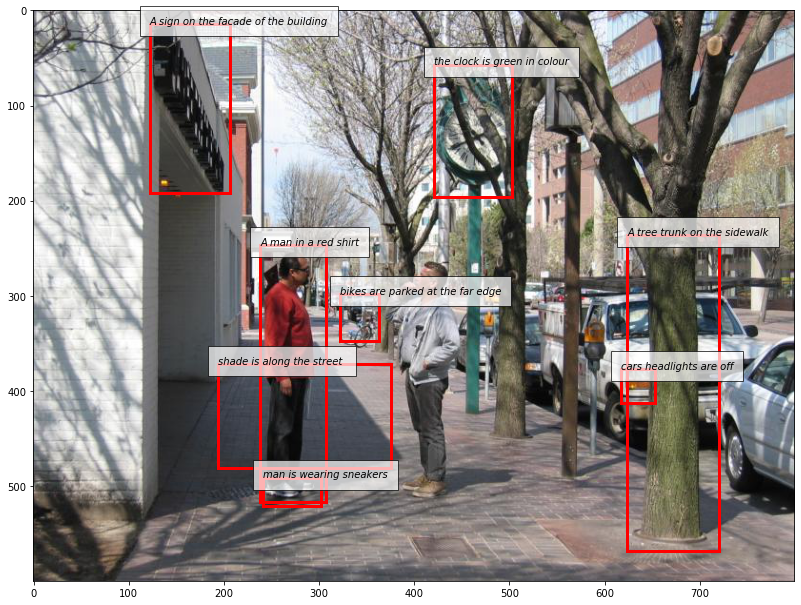

Top 10 most similar images to image 1 in Visual Genome:
Image id: 2389254 Euclidean distance: 2.6787
Image data: id: 2389254, coco_id: -1, flickr_id: 6177834800, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2389254.jpg


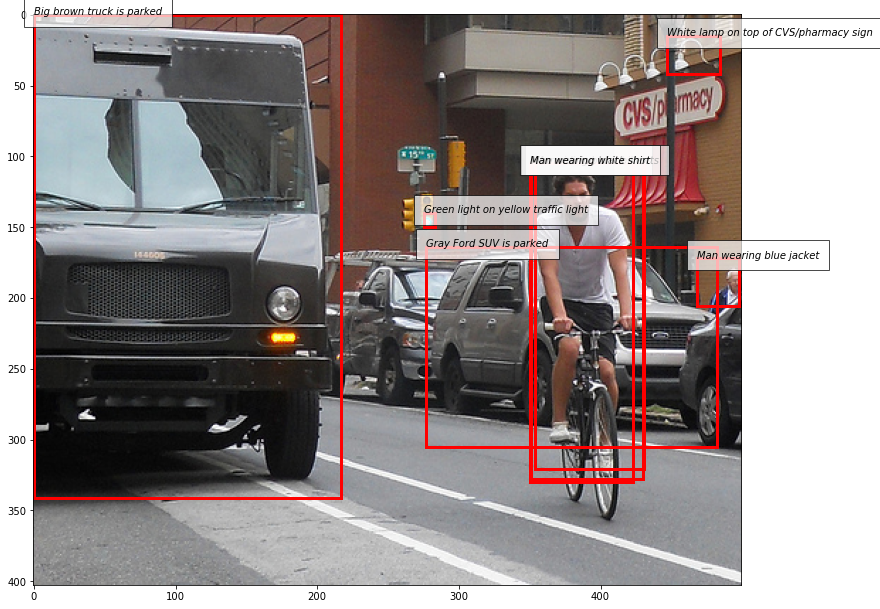

Image id: 2349133 Euclidean distance: 2.8271
Image data: id: 2349133, coco_id: 278656, flickr_id: 664254030, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2349133.jpg


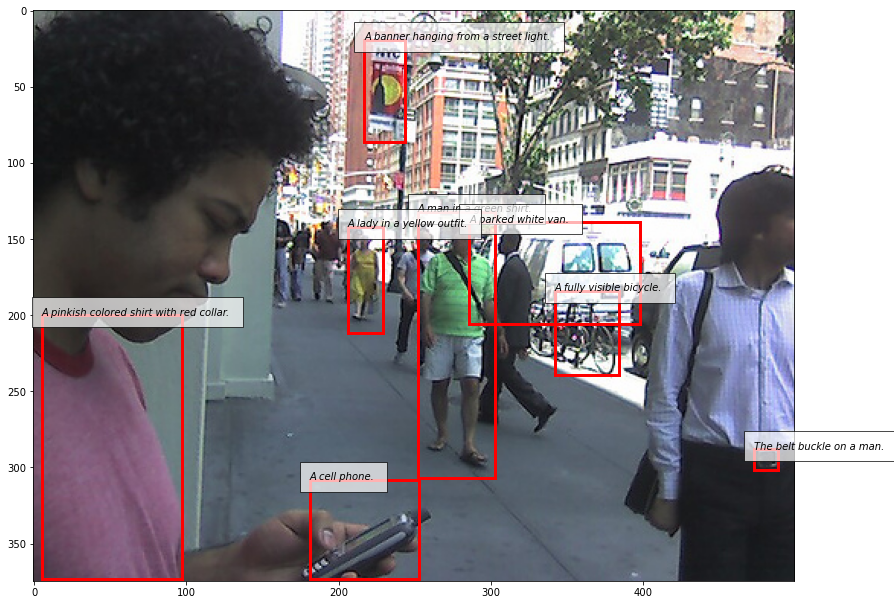

Image id: 2358188 Euclidean distance: 2.9146
Image data: id: 2358188, coco_id: -1, flickr_id: 4888008987, width: 357, url: https://cs.stanford.edu/people/rak248/VG_100K/2358188.jpg


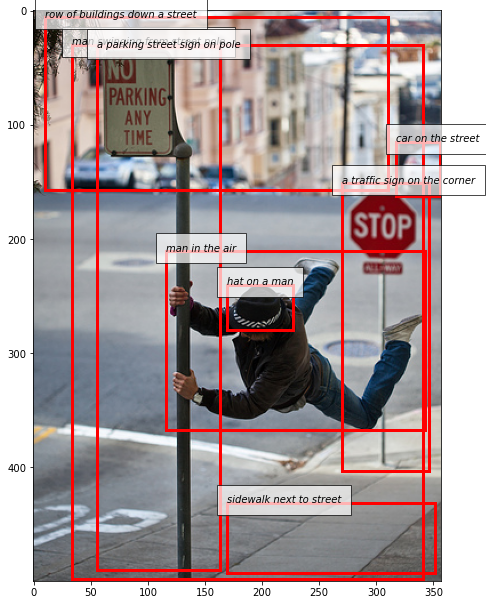

Image id: 2410466 Euclidean distance: 2.9482
Image data: id: 2410466, coco_id: 7938, flickr_id: 1327113850, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2410466.jpg


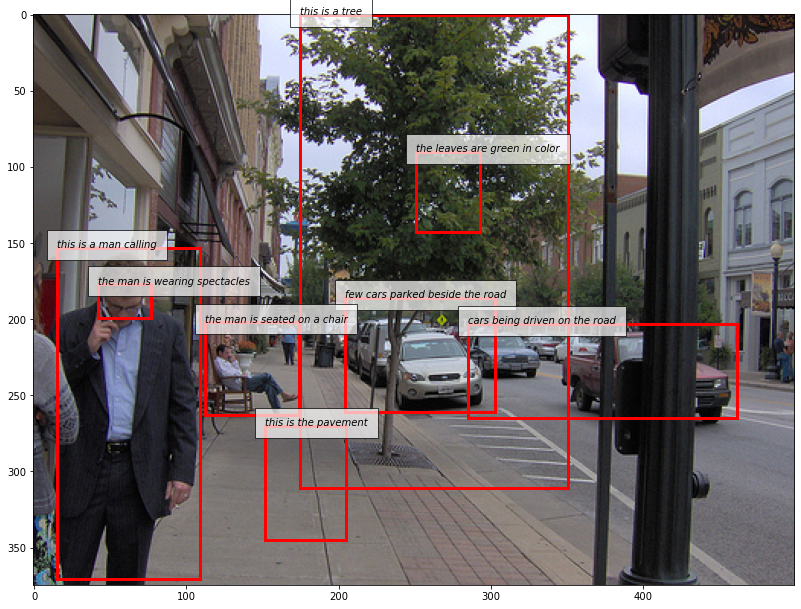

Image id: 16 Euclidean distance: 2.9936
Image data: id: 16, coco_id: -1, flickr_id: -1, width: 800, url: https://cs.stanford.edu/people/rak248/VG_100K/16.jpg


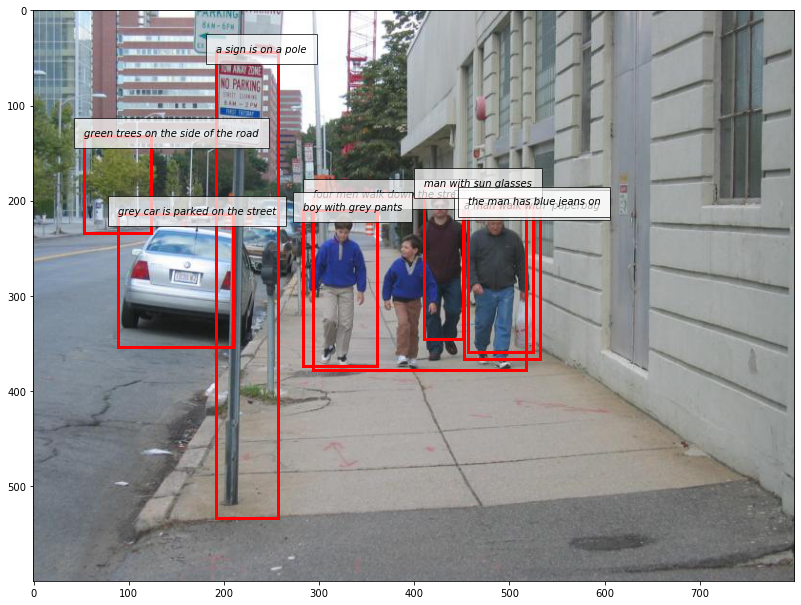

Image id: 2334242 Euclidean distance: 3.0336
Image data: id: 2334242, coco_id: 8211, flickr_id: 5055051223, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2334242.jpg


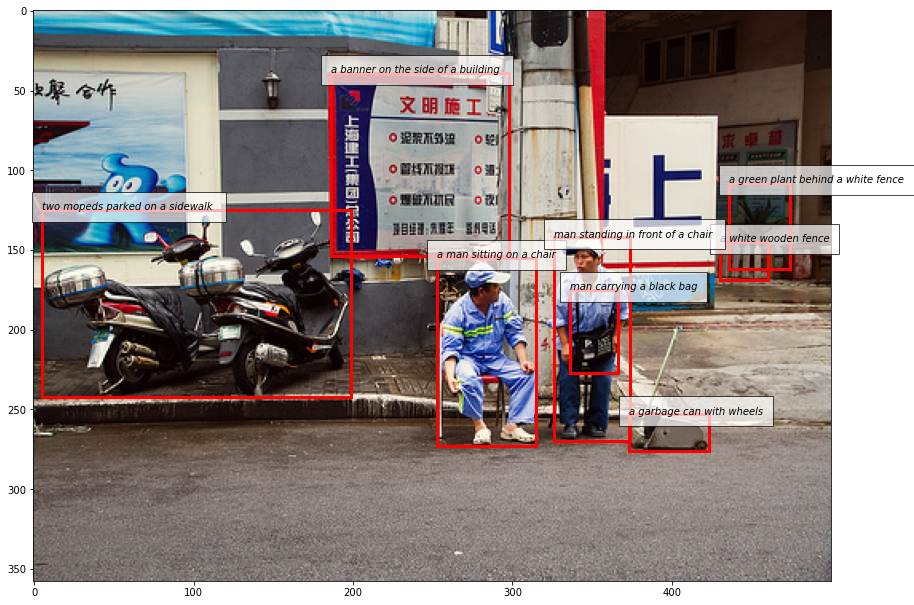

Image id: 2329537 Euclidean distance: 3.0682
Image data: id: 2329537, coco_id: -1, flickr_id: 8310839239, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2329537.jpg


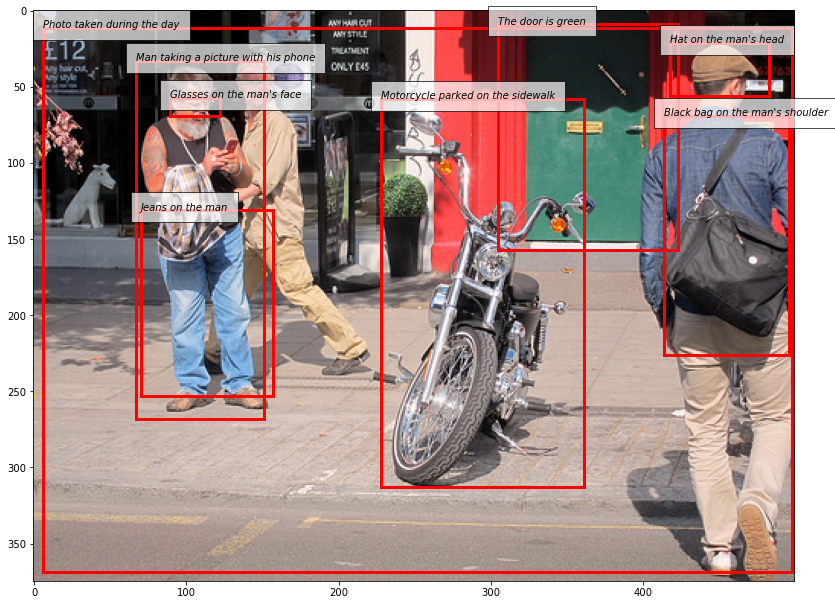

Image id: 2393941 Euclidean distance: 3.0687
Image data: id: 2393941, coco_id: -1, flickr_id: 4121782384, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2393941.jpg


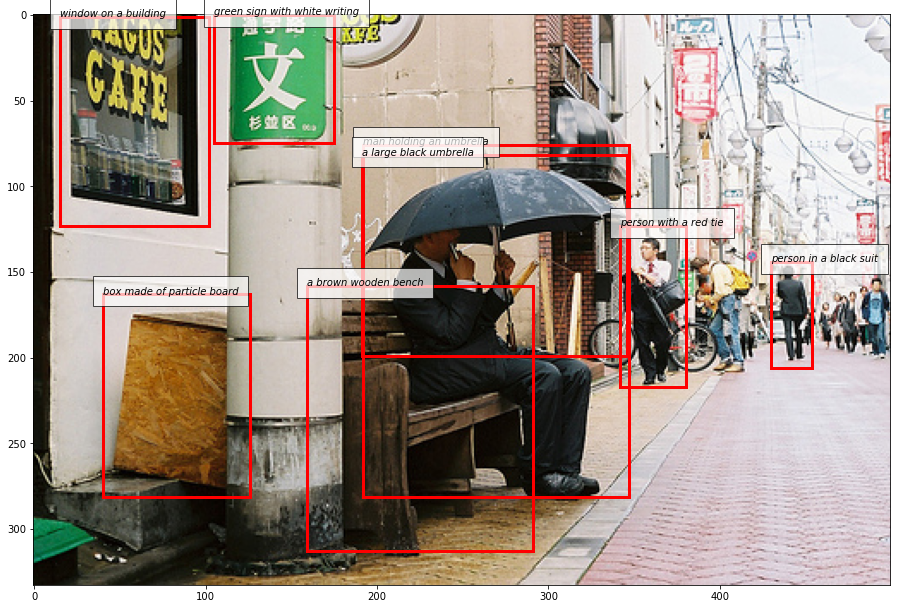

Image id: 2358767 Euclidean distance: 3.1116
Image data: id: 2358767, coco_id: 477459, flickr_id: 3079325343, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2358767.jpg


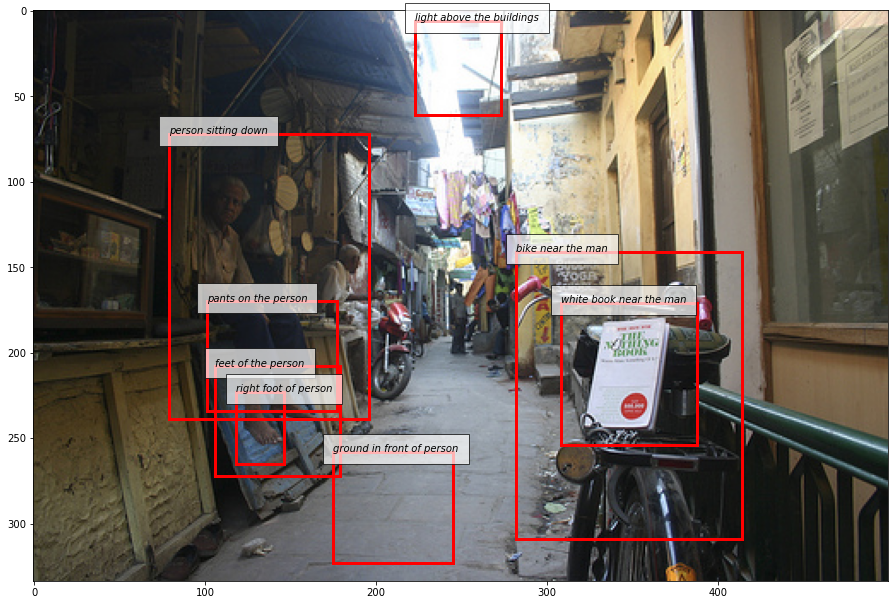

Image id: 2377786 Euclidean distance: 3.1237
Image data: id: 2377786, coco_id: -1, flickr_id: 7156085969, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2377786.jpg


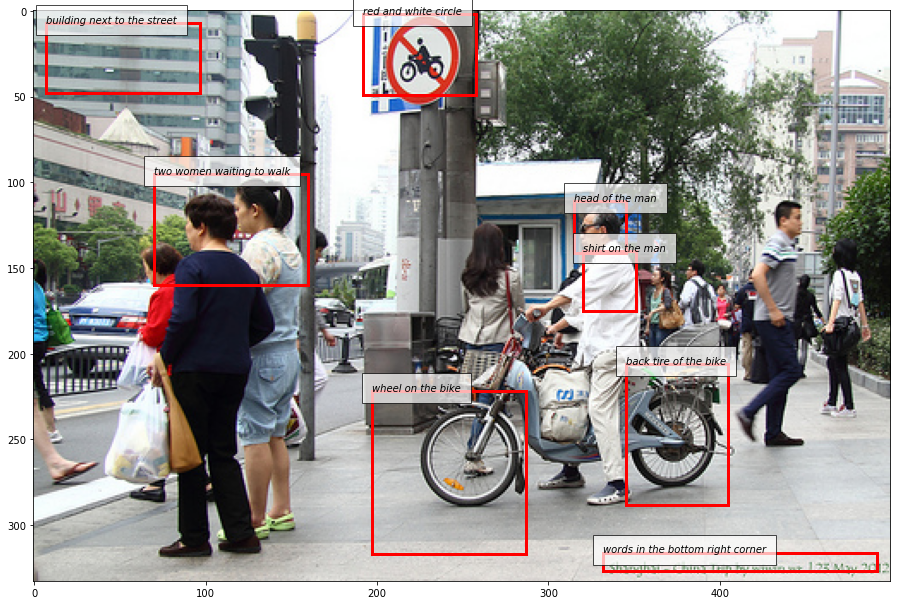

In [30]:
input_id = 1
top_images = retrieve_images(embeddings_method, image_regions, input_id = input_id)

In [31]:
top_images

,image_id,distances
32189,2389254,2.678674
70501,2349133,2.827116
61862,2358188,2.914599
11897,2410466,2.948222
14,16,2.993631
84717,2334242,3.033598
89213,2329537,3.068171
27680,2393941,3.068686
61301,2358767,3.111583
43120,2377786,3.123686


## Similar image retrieval based on given user sentence


In [26]:
input_sentence = 'a cat is sleeping on the beach'

In [27]:
input_embedding = get_embeddings(model_1, input_sentence)

Images retrieved using method: embeddings_1
Top 10 most similar images to image -1 in Visual Genome:
Image id: 2331669 Euclidean distance: 9.7977
Image data: id: 2331669, coco_id: 155199, flickr_id: 3491028758, width: 375, url: https://cs.stanford.edu/people/rak248/VG_100K/2331669.jpg


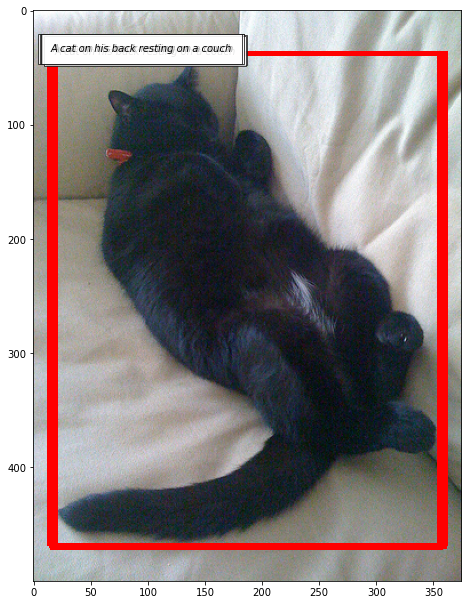

Image id: 2406450 Euclidean distance: 10.5729
Image data: id: 2406450, coco_id: -1, flickr_id: 559890723, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2406450.jpg


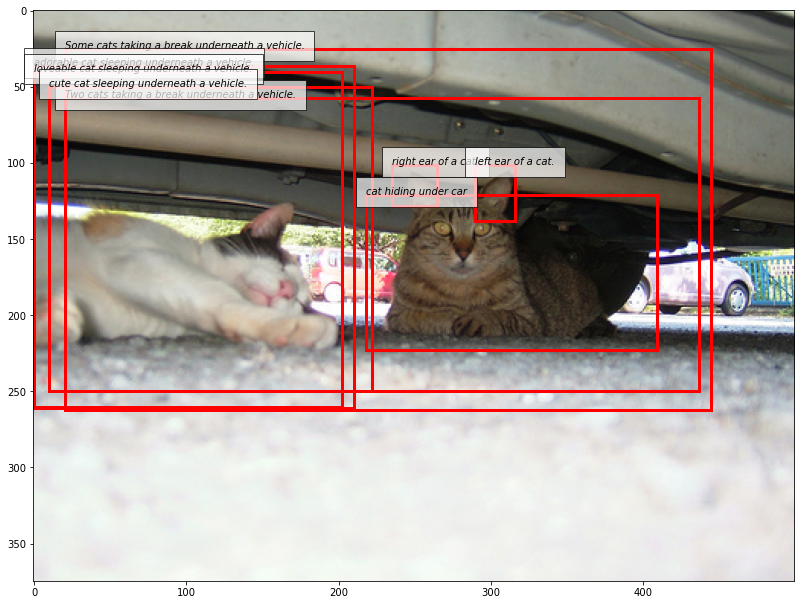

Image id: 2341662 Euclidean distance: 10.6002
Image data: id: 2341662, coco_id: 45208, flickr_id: 2323574426, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2341662.jpg


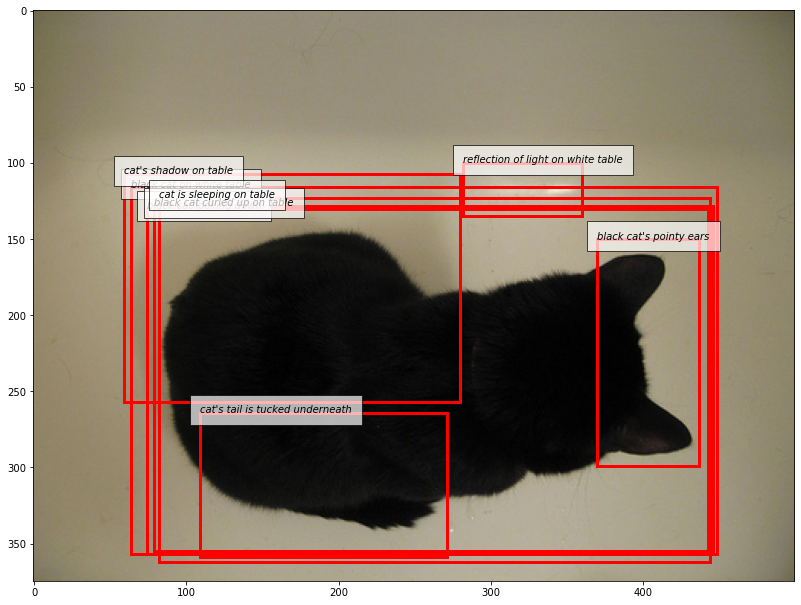

Image id: 2327334 Euclidean distance: 11.0853
Image data: id: 2327334, coco_id: -1, flickr_id: 760075481, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2327334.jpg


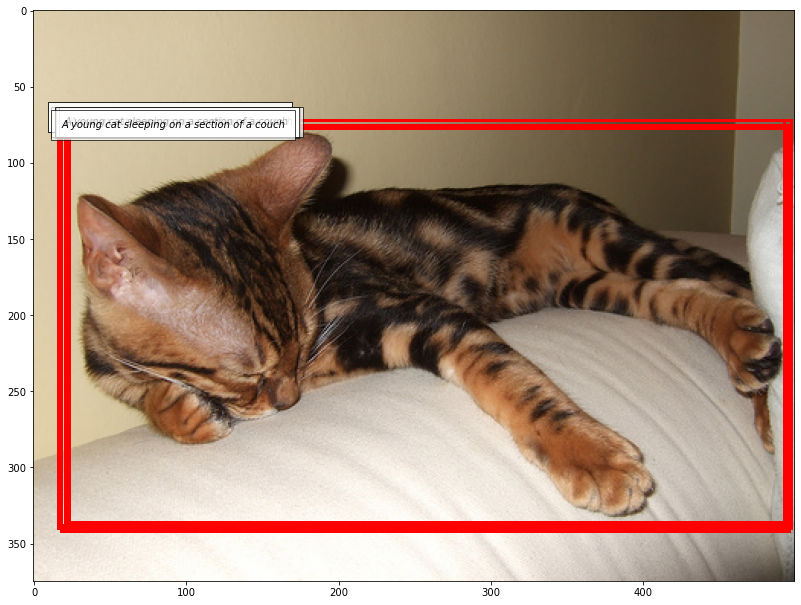

Image id: 2340105 Euclidean distance: 11.1335
Image data: id: 2340105, coco_id: -1, flickr_id: 6448744811, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2340105.jpg


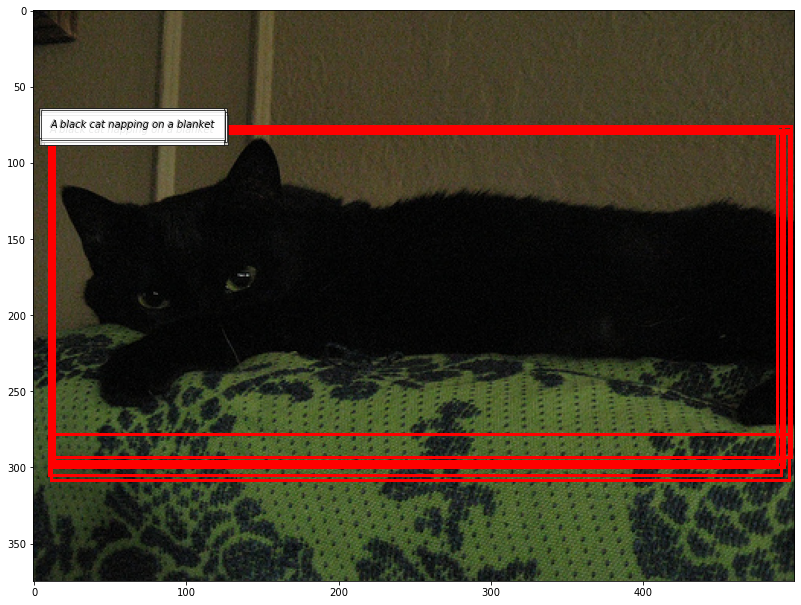

Image id: 2396717 Euclidean distance: 11.1849
Image data: id: 2396717, coco_id: -1, flickr_id: 306632756, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2396717.jpg


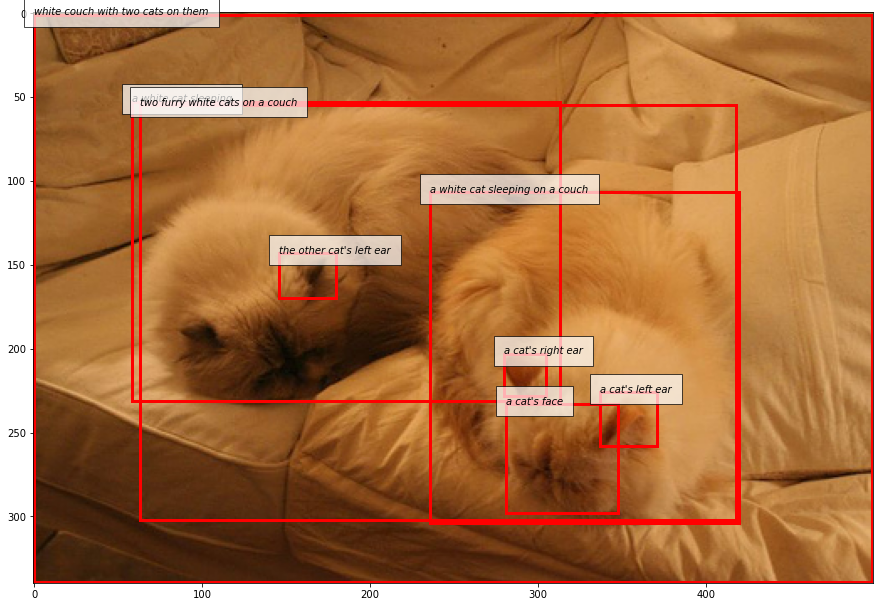

Image id: 2337124 Euclidean distance: 11.2564
Image data: id: 2337124, coco_id: 454601, flickr_id: 4260750895, width: 375, url: https://cs.stanford.edu/people/rak248/VG_100K/2337124.jpg


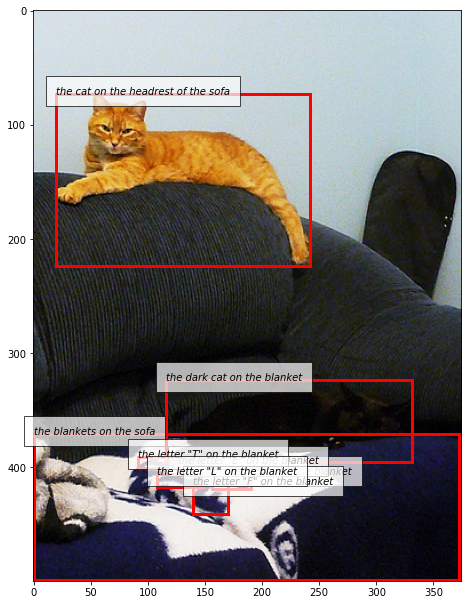

Image id: 2335714 Euclidean distance: 11.2632
Image data: id: 2335714, coco_id: -1, flickr_id: 4217348785, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2335714.jpg


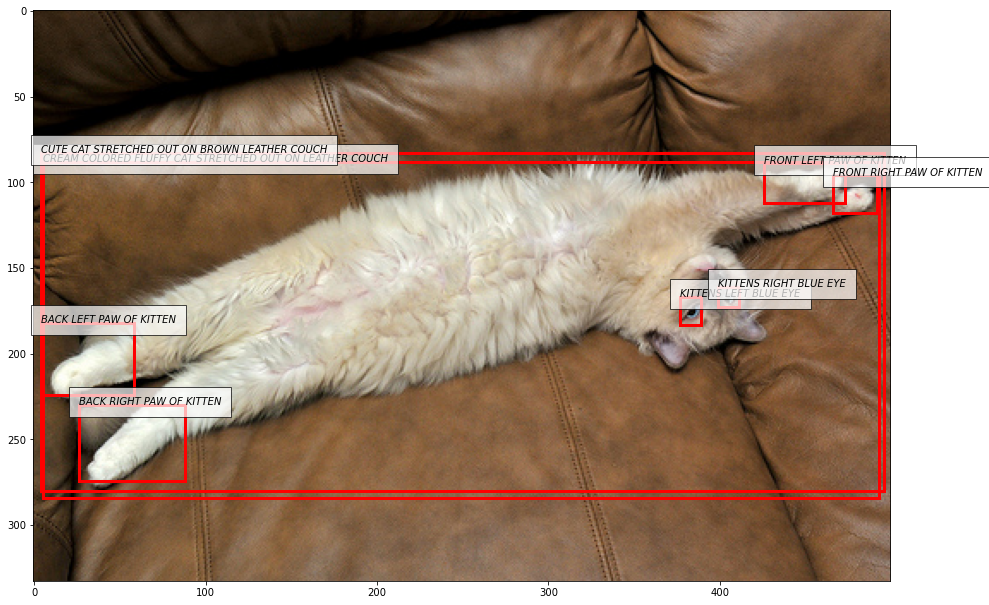

Image id: 2356841 Euclidean distance: 11.2935
Image data: id: 2356841, coco_id: 235842, flickr_id: 2546904630, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2356841.jpg


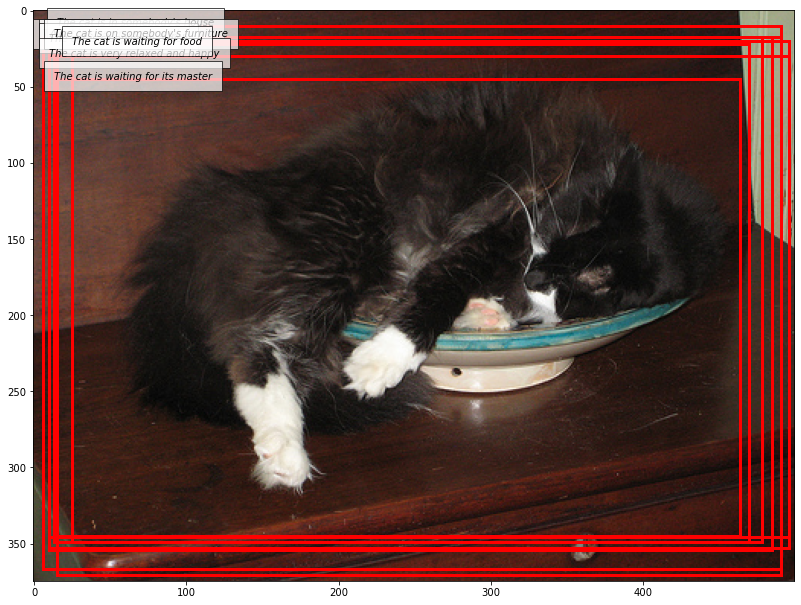

Image id: 2316884 Euclidean distance: 11.3400
Image data: id: 2316884, coco_id: 551815, flickr_id: 2126259110, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2316884.jpg


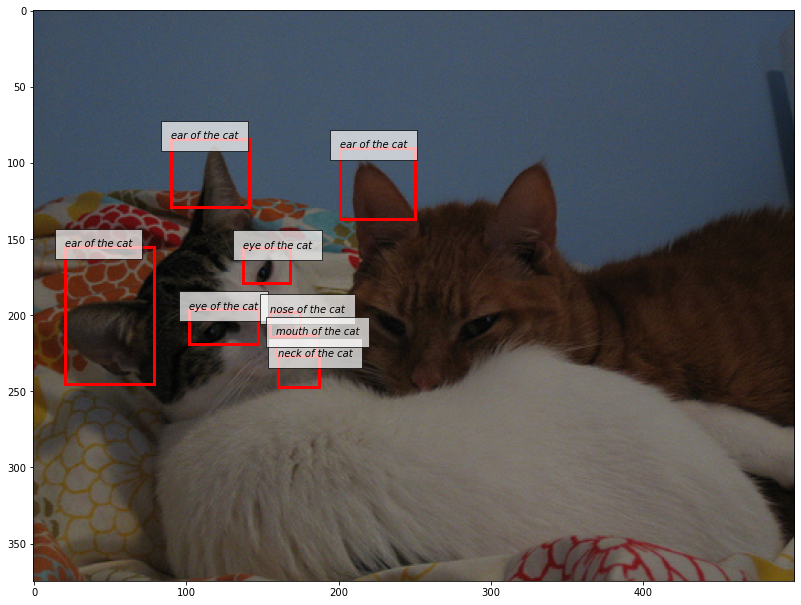

In [28]:
top_images_2 = retrieve_images(embeddings_method, image_regions, input_id = -1, input_embedding=input_embedding)

In [29]:
top_images_2

,image_id,distances
87172,2331669,9.797684
15735,2406450,10.572929
77629,2341662,10.600173
91313,2327334,11.085283
79123,2340105,11.133454
25056,2396717,11.184939
81967,2337124,11.256410
83308,2335714,11.263158
63134,2356841,11.293504
101339,2316884,11.340034
